In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import matplotlib.pyplot as plt

In [2]:
class Discriminator(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Linear(in_features, 128),
            nn.LeakyReLU(0.01),
            nn.Linear(128, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.disc(x)

In [3]:
class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.01),
            nn.Linear(256, img_dim),
            nn.Tanh(),  # normalize inputs to [-1, 1] so make outputs [-1, 1]
        )

    def forward(self, x):
        return self.gen(x)

In [4]:
# Hyperparameters etc.
device = "cuda" if torch.cuda.is_available() else "cpu"
lr = 3e-4
z_dim = 64
image_dim = 28 * 28 * 1  # 784
batch_size = 32
num_epochs = 50

disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)
fixed_noise = torch.randn((batch_size, z_dim)).to(device)
transforms = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,)),
    ]
)

dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
opt_disc = optim.Adam(disc.parameters(), lr=lr)
opt_gen = optim.Adam(gen.parameters(), lr=lr)
criterion = nn.BCELoss()
writer_fake = SummaryWriter(f"logs/fake")
writer_real = SummaryWriter(f"logs/real")
step = 0

2023-06-15 15:17:35.719626: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
dataset

Dataset MNIST
    Number of datapoints: 60000
    Root location: dataset/
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )

In [6]:
lossG_arr = []
lossD_arr = []

Epoch [0/50] Batch 0/1875                       Loss D: 0.6982, loss G: 0.6838


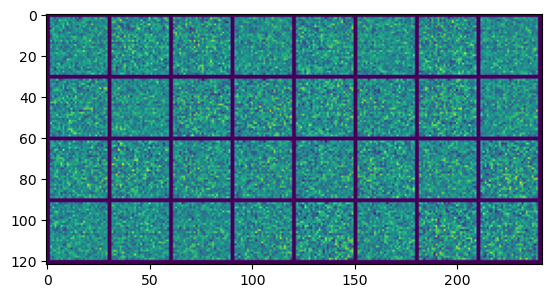

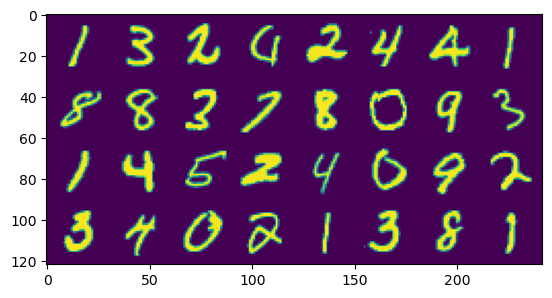

Epoch [1/50] Batch 0/1875                       Loss D: 0.6694, loss G: 0.7243


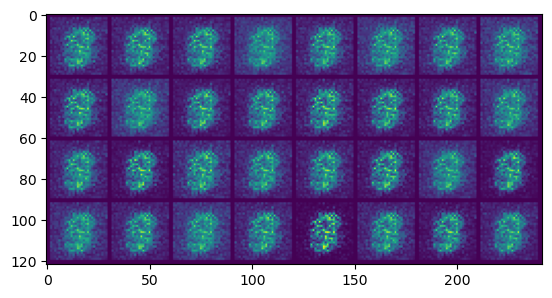

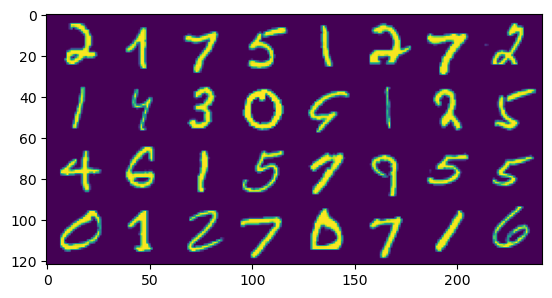

Epoch [2/50] Batch 0/1875                       Loss D: 0.2530, loss G: 1.6915


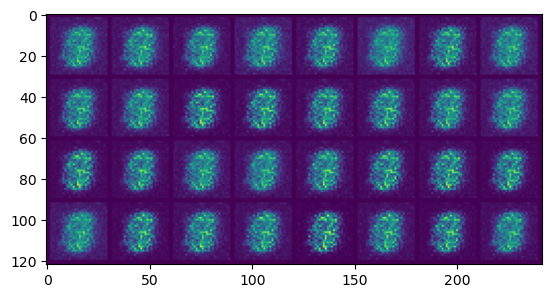

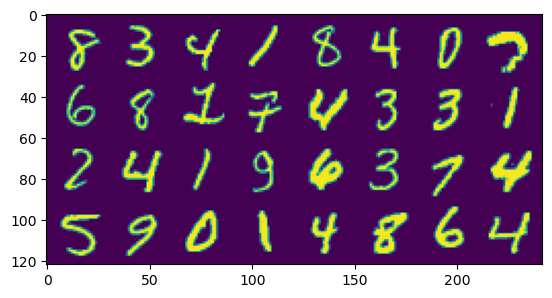

Epoch [3/50] Batch 0/1875                       Loss D: 0.4216, loss G: 1.3413


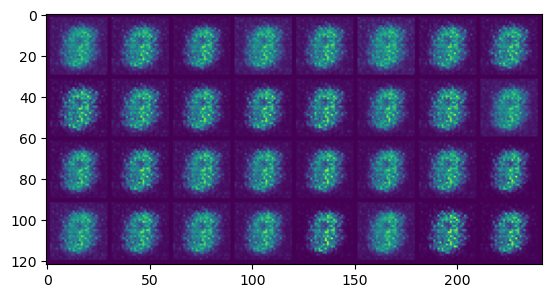

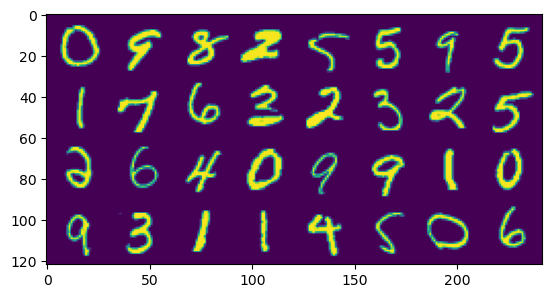

Epoch [4/50] Batch 0/1875                       Loss D: 0.3375, loss G: 1.2862


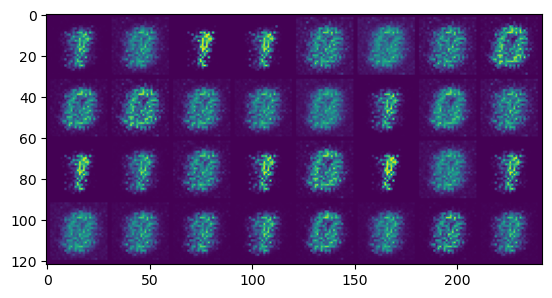

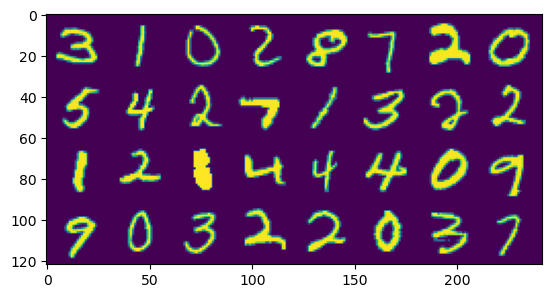

Epoch [5/50] Batch 0/1875                       Loss D: 0.5882, loss G: 1.3566


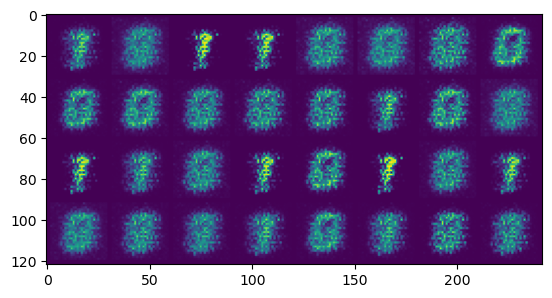

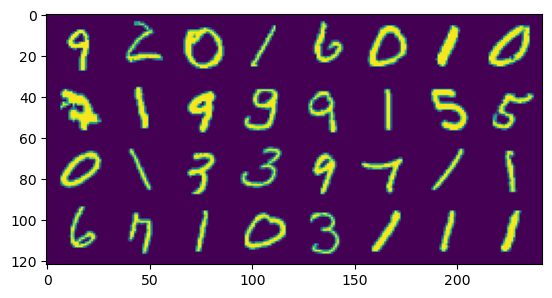

Epoch [6/50] Batch 0/1875                       Loss D: 0.7230, loss G: 0.8193


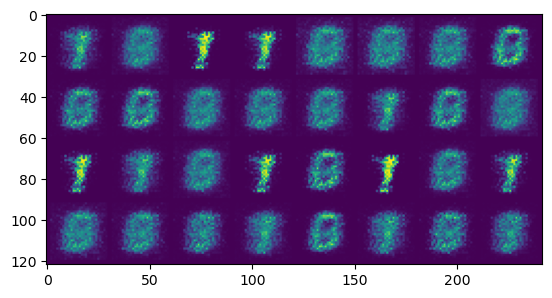

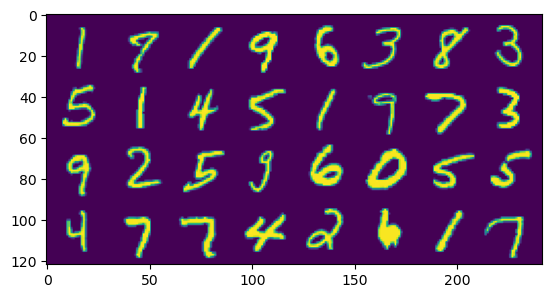

Epoch [7/50] Batch 0/1875                       Loss D: 1.1197, loss G: 0.8663


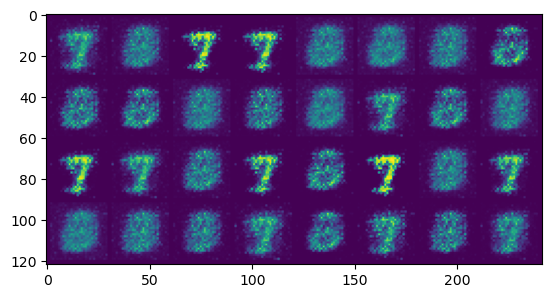

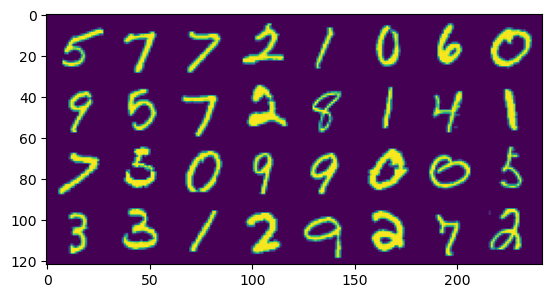

Epoch [8/50] Batch 0/1875                       Loss D: 0.6835, loss G: 1.0227


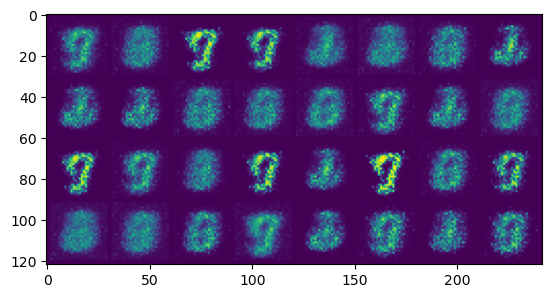

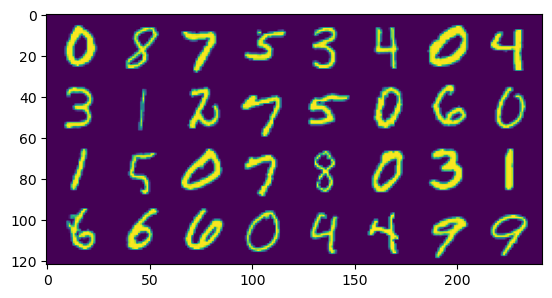

Epoch [9/50] Batch 0/1875                       Loss D: 0.4655, loss G: 1.2758


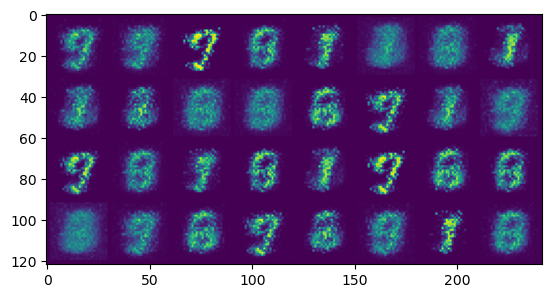

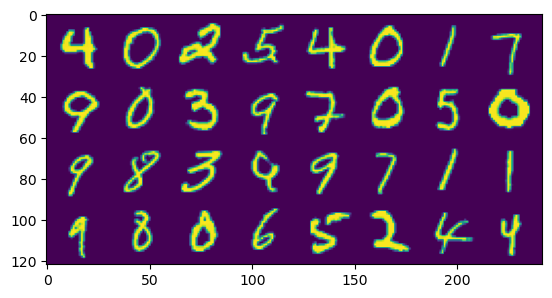

Epoch [10/50] Batch 0/1875                       Loss D: 0.8180, loss G: 0.9173


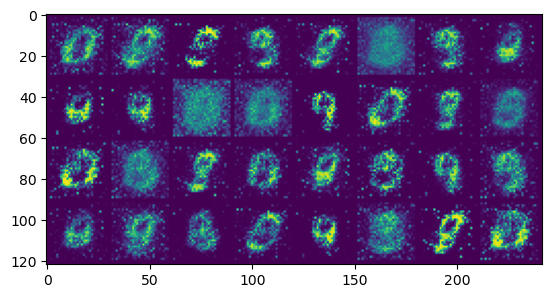

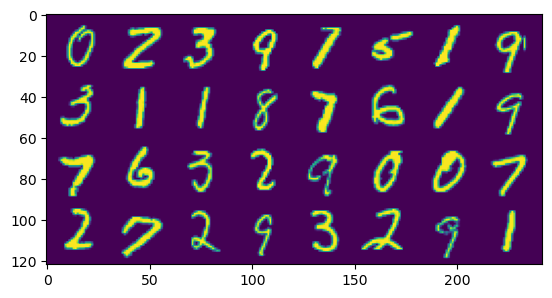

Epoch [11/50] Batch 0/1875                       Loss D: 0.5612, loss G: 1.2680


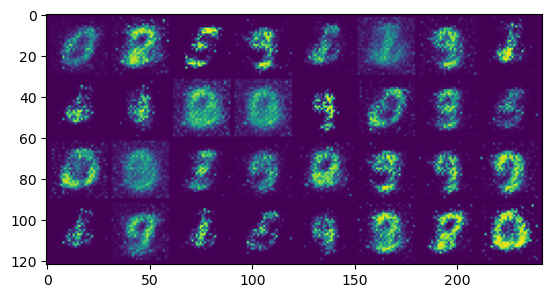

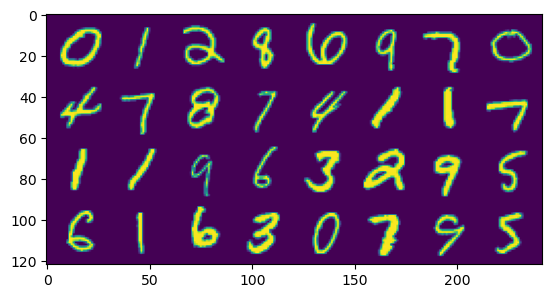

Epoch [12/50] Batch 0/1875                       Loss D: 0.6106, loss G: 1.3534


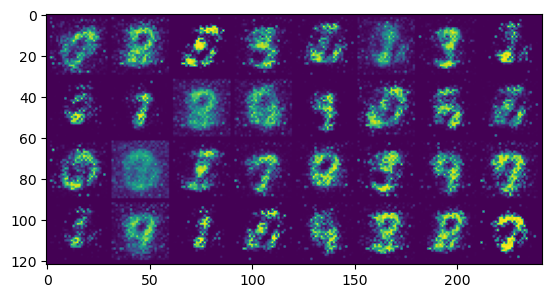

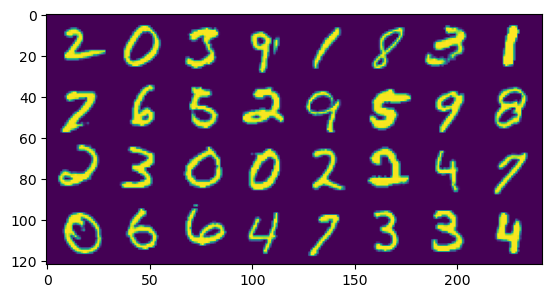

Epoch [13/50] Batch 0/1875                       Loss D: 0.4981, loss G: 1.3633


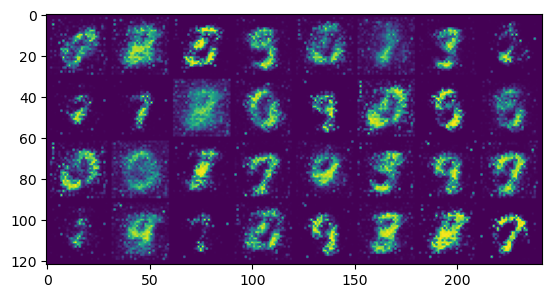

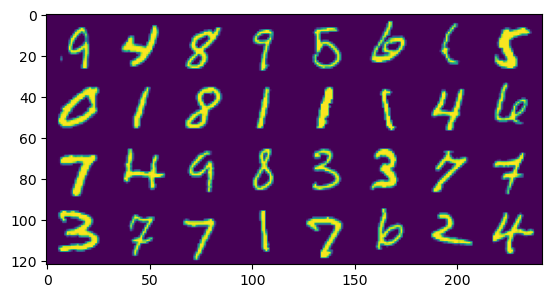

Epoch [14/50] Batch 0/1875                       Loss D: 0.6618, loss G: 1.3056


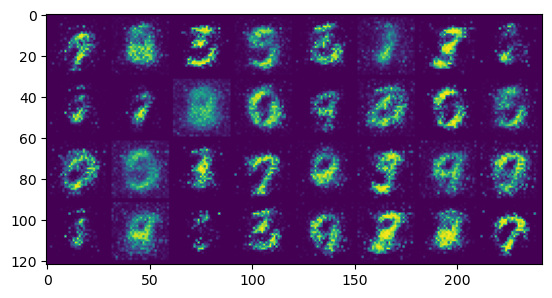

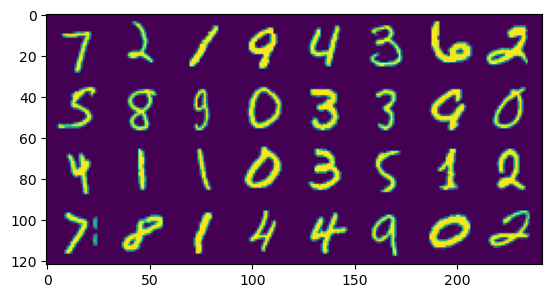

Epoch [15/50] Batch 0/1875                       Loss D: 0.3859, loss G: 2.6227


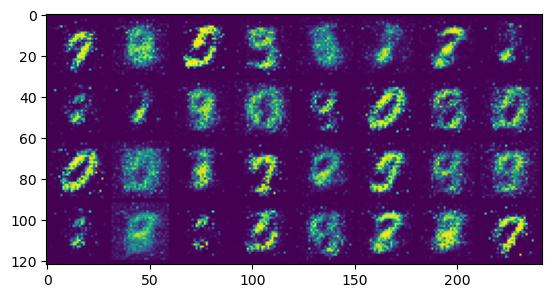

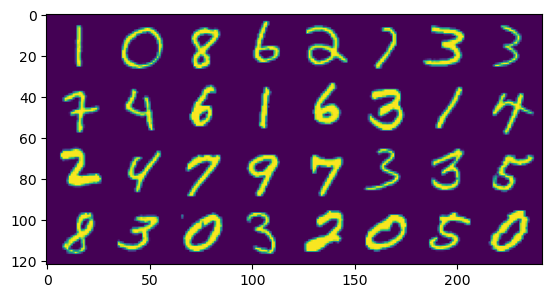

Epoch [16/50] Batch 0/1875                       Loss D: 0.4709, loss G: 1.8292


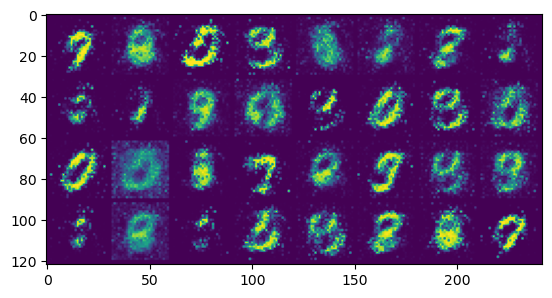

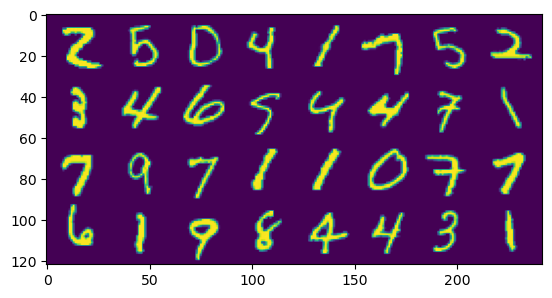

Epoch [17/50] Batch 0/1875                       Loss D: 0.7838, loss G: 1.1975


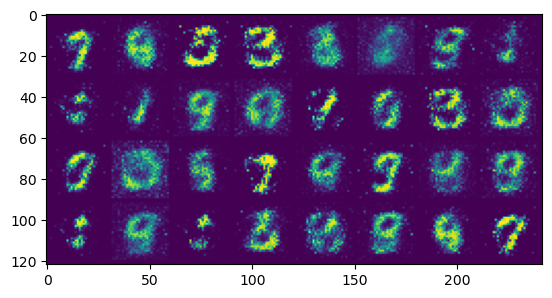

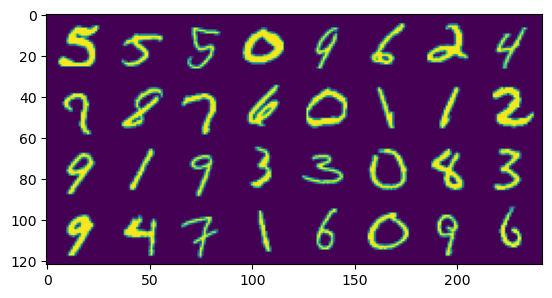

Epoch [18/50] Batch 0/1875                       Loss D: 0.6820, loss G: 0.9407


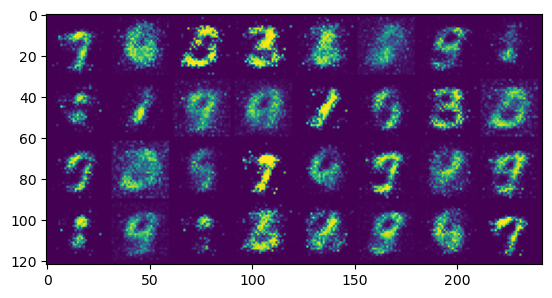

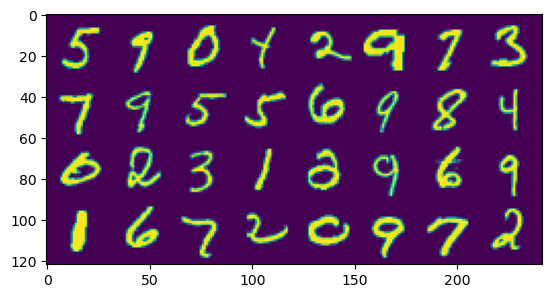

Epoch [19/50] Batch 0/1875                       Loss D: 0.3694, loss G: 1.5971


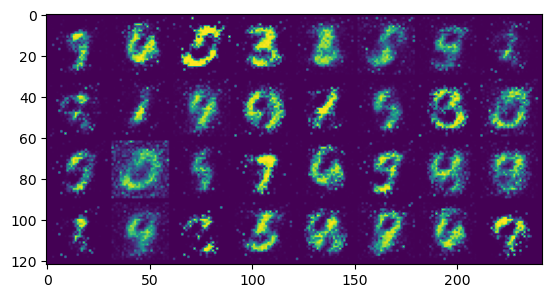

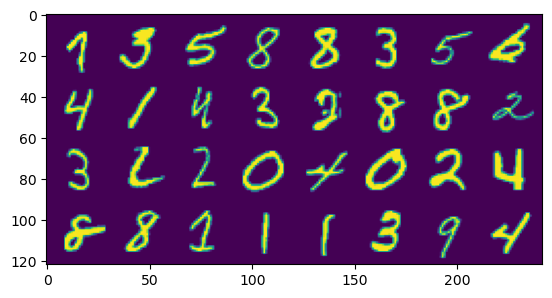

Epoch [20/50] Batch 0/1875                       Loss D: 0.5526, loss G: 1.5984


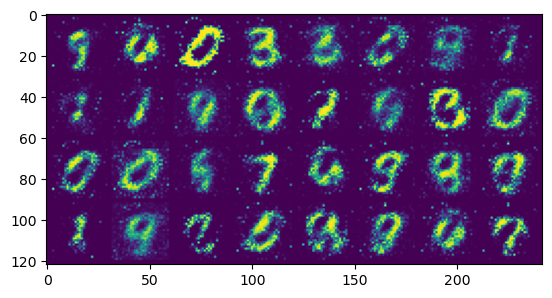

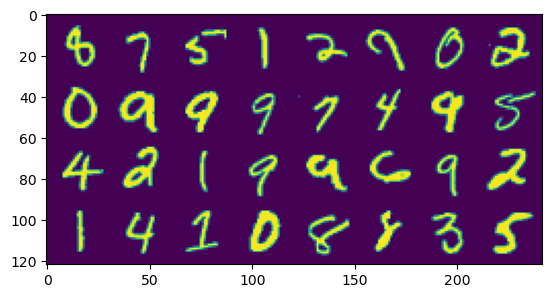

Epoch [21/50] Batch 0/1875                       Loss D: 0.4549, loss G: 2.1211


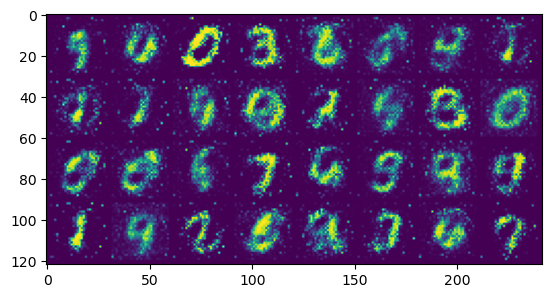

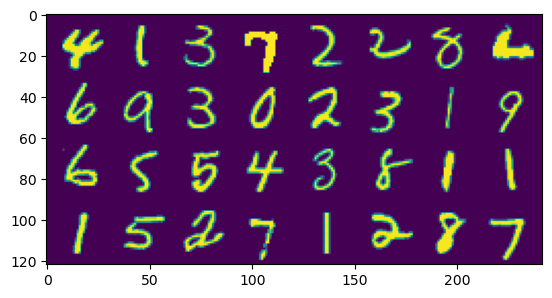

Epoch [22/50] Batch 0/1875                       Loss D: 0.7001, loss G: 1.0919


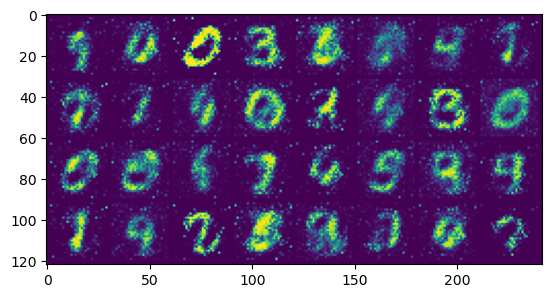

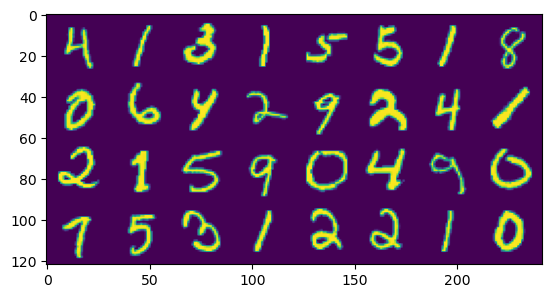

Epoch [23/50] Batch 0/1875                       Loss D: 0.6219, loss G: 1.2461


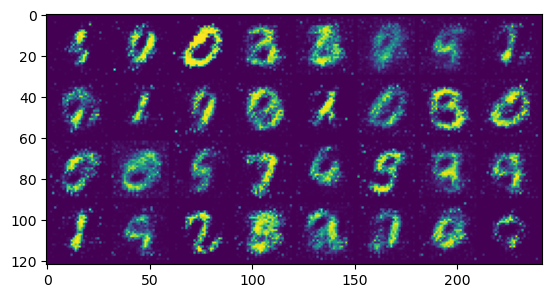

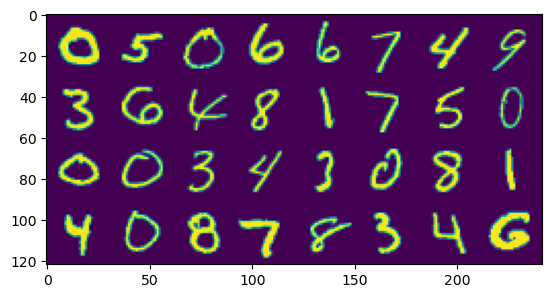

Epoch [24/50] Batch 0/1875                       Loss D: 0.5358, loss G: 1.3329


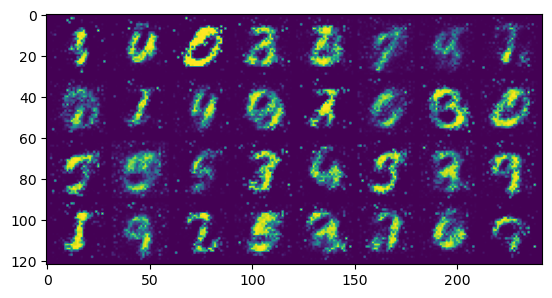

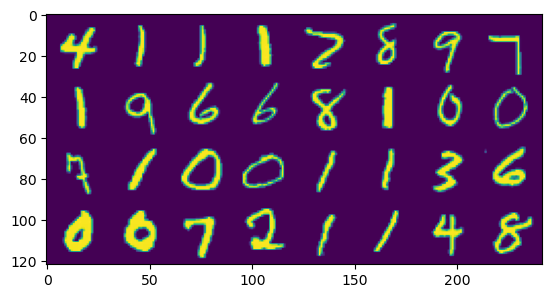

Epoch [25/50] Batch 0/1875                       Loss D: 0.6641, loss G: 1.2307


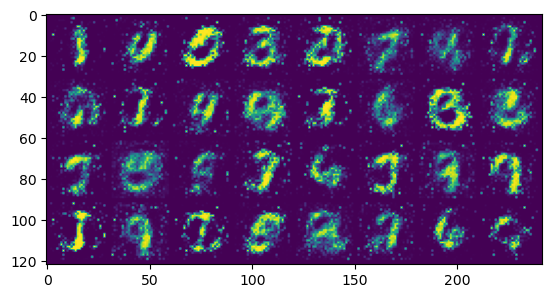

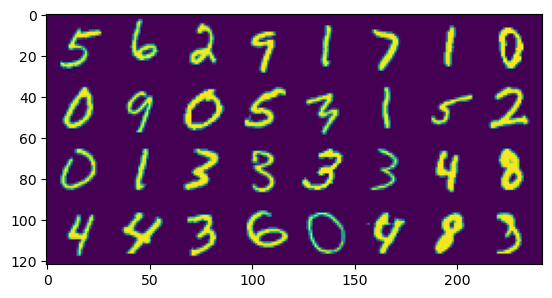

Epoch [26/50] Batch 0/1875                       Loss D: 0.8028, loss G: 1.2169


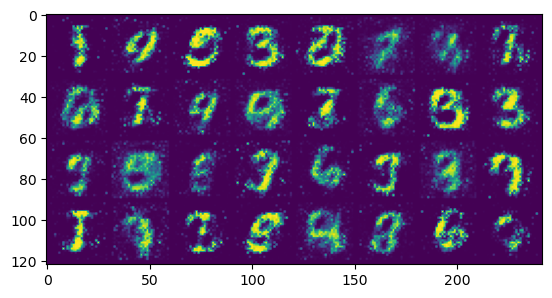

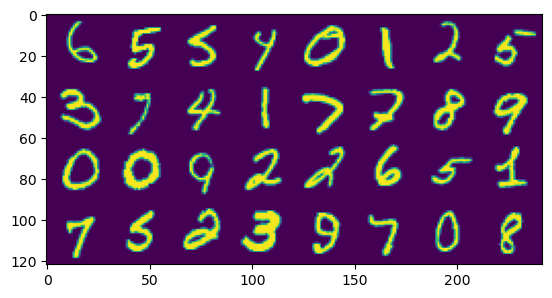

Epoch [27/50] Batch 0/1875                       Loss D: 0.4841, loss G: 1.4884


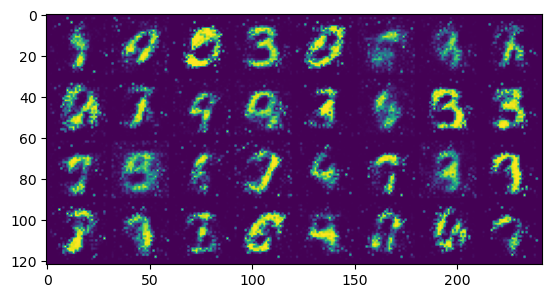

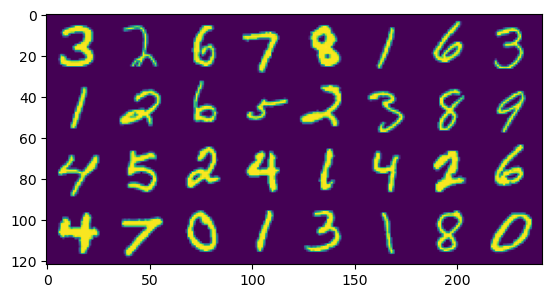

Epoch [28/50] Batch 0/1875                       Loss D: 0.6075, loss G: 1.5322


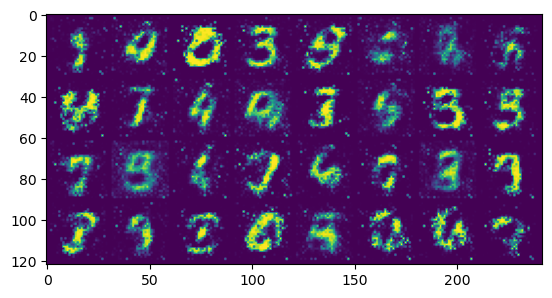

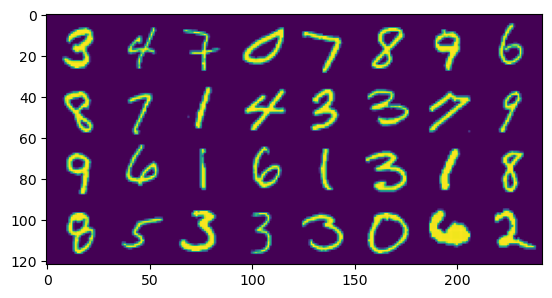

Epoch [29/50] Batch 0/1875                       Loss D: 0.7441, loss G: 0.9463


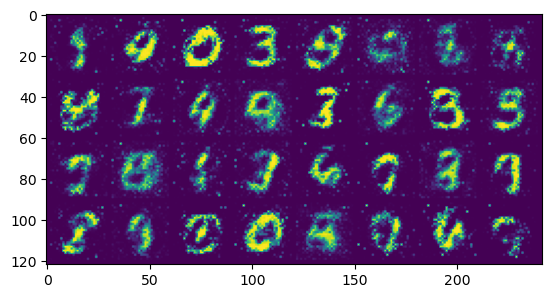

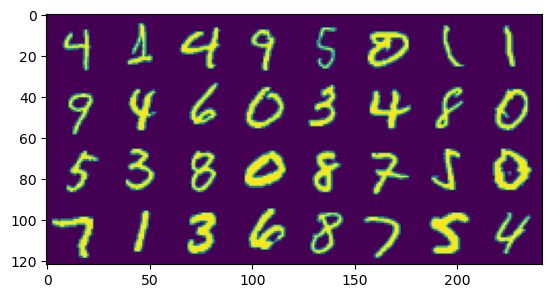

Epoch [30/50] Batch 0/1875                       Loss D: 0.6922, loss G: 1.1151


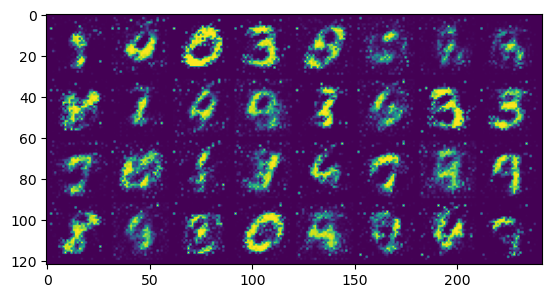

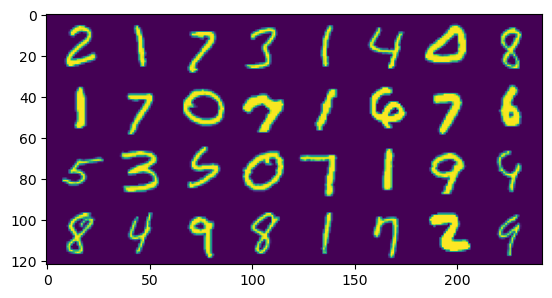

Epoch [31/50] Batch 0/1875                       Loss D: 0.5855, loss G: 1.4220


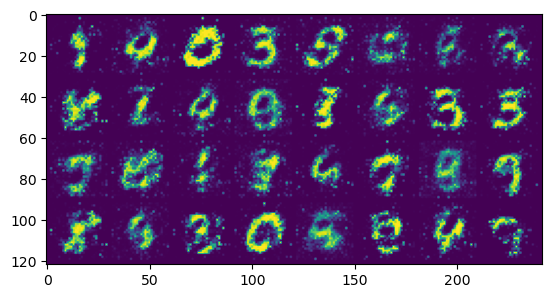

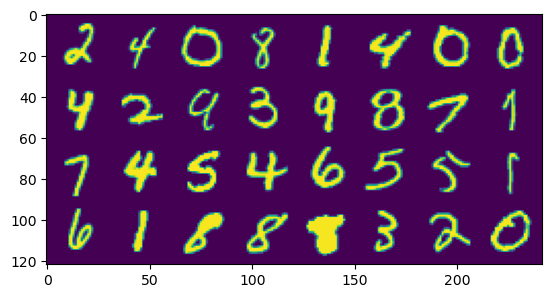

Epoch [32/50] Batch 0/1875                       Loss D: 0.5250, loss G: 1.7143


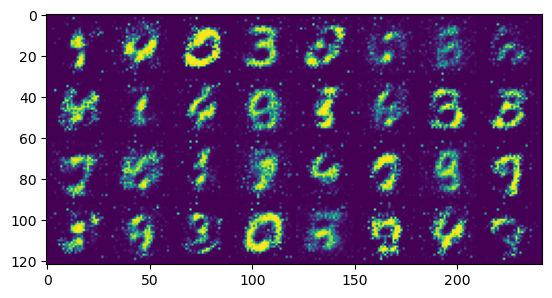

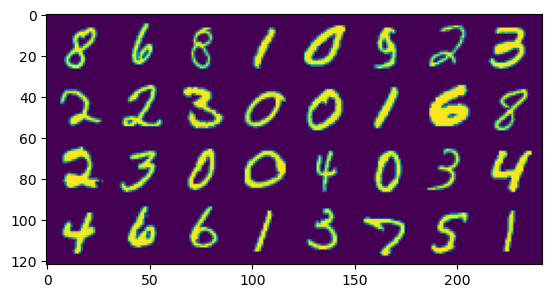

Epoch [33/50] Batch 0/1875                       Loss D: 0.5439, loss G: 1.3178


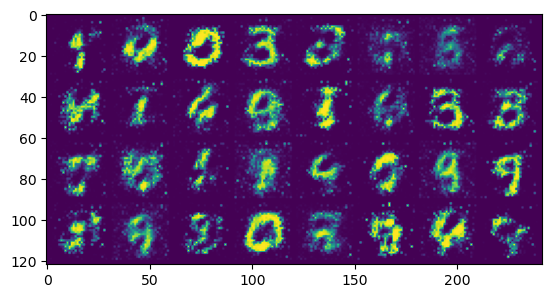

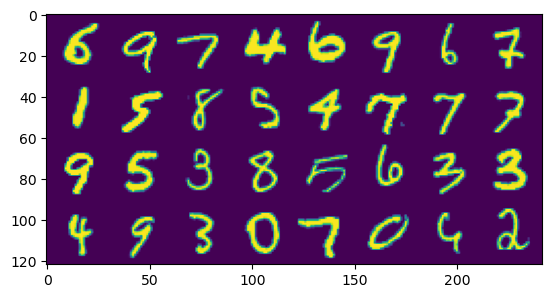

Epoch [34/50] Batch 0/1875                       Loss D: 0.8324, loss G: 1.2447


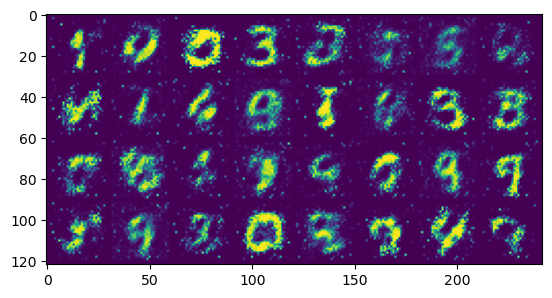

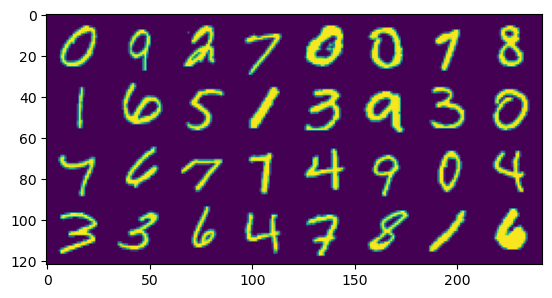

Epoch [35/50] Batch 0/1875                       Loss D: 0.6493, loss G: 1.2249


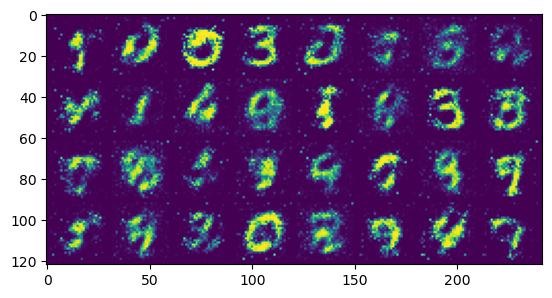

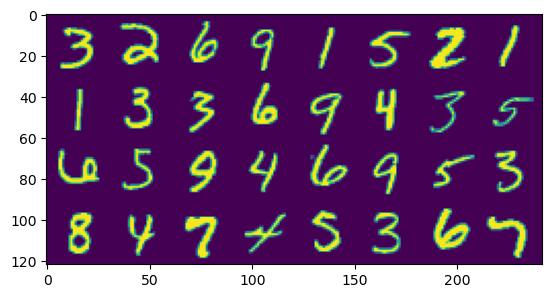

Epoch [36/50] Batch 0/1875                       Loss D: 0.5281, loss G: 1.5024


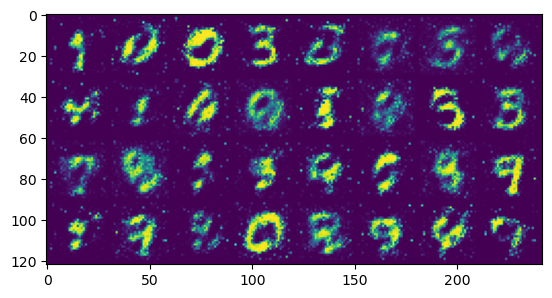

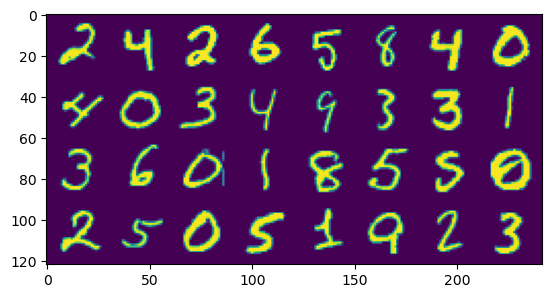

Epoch [37/50] Batch 0/1875                       Loss D: 0.6061, loss G: 0.9475


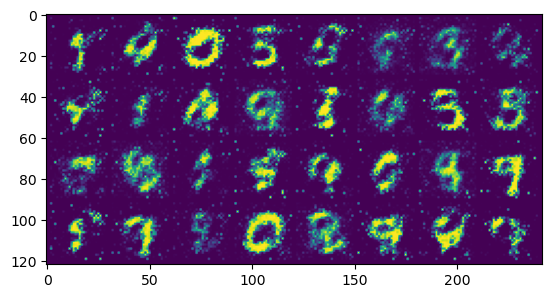

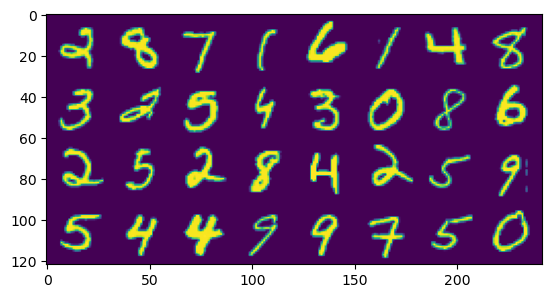

Epoch [38/50] Batch 0/1875                       Loss D: 0.8924, loss G: 0.8288


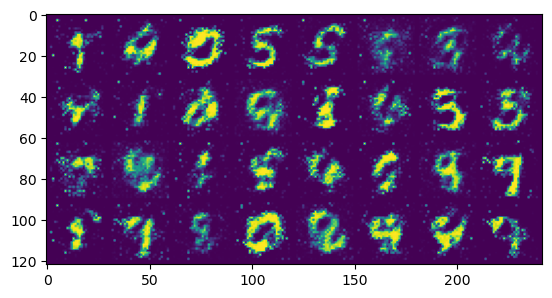

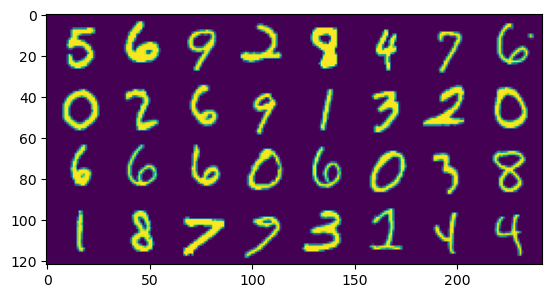

Epoch [39/50] Batch 0/1875                       Loss D: 0.6328, loss G: 0.8748


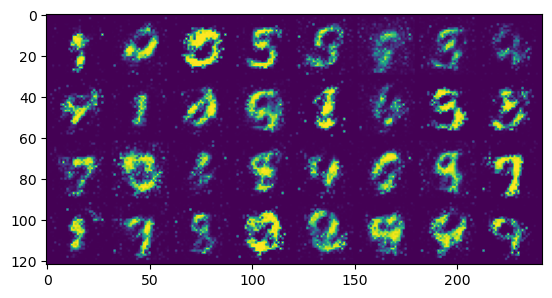

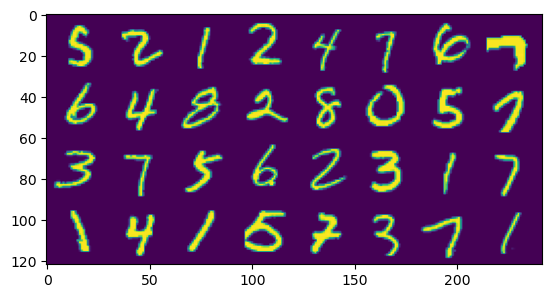

Epoch [40/50] Batch 0/1875                       Loss D: 0.5922, loss G: 1.5913


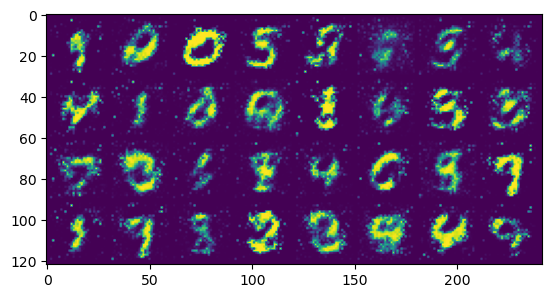

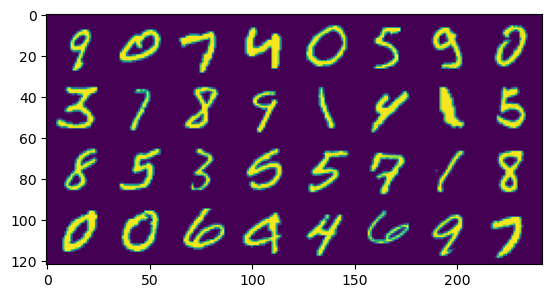

Epoch [41/50] Batch 0/1875                       Loss D: 0.6628, loss G: 1.0235


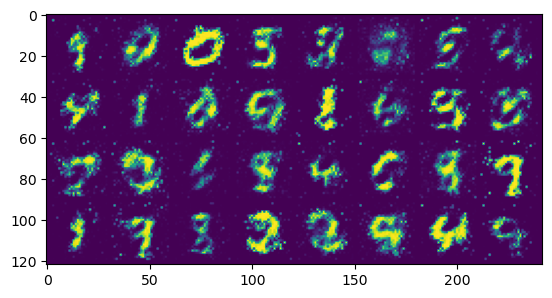

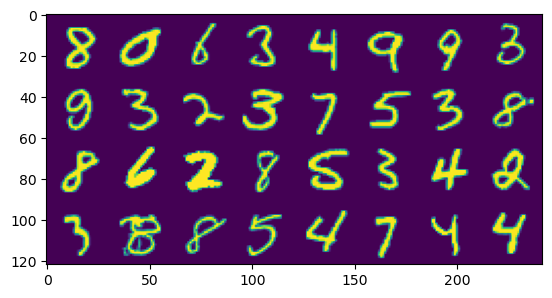

Epoch [42/50] Batch 0/1875                       Loss D: 0.6525, loss G: 1.1677


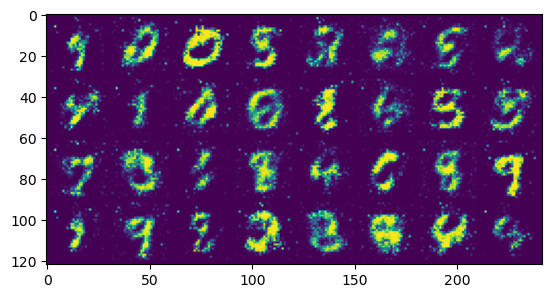

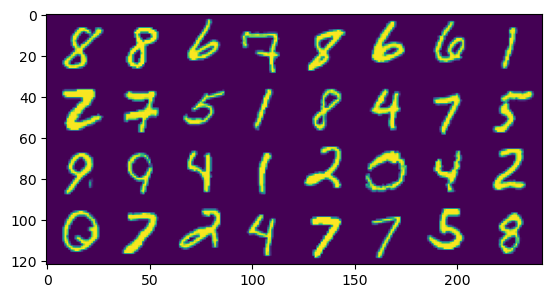

Epoch [43/50] Batch 0/1875                       Loss D: 0.5217, loss G: 1.1465


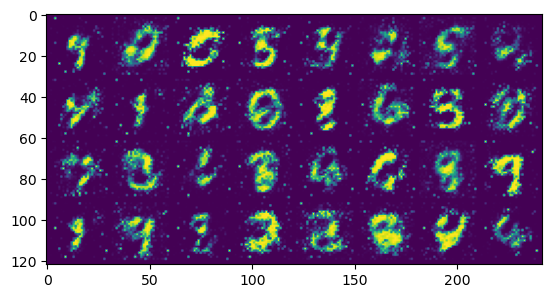

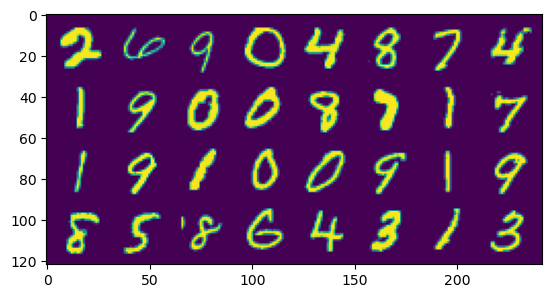

Epoch [44/50] Batch 0/1875                       Loss D: 0.5765, loss G: 1.3167


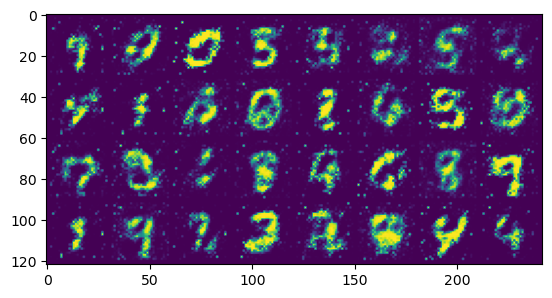

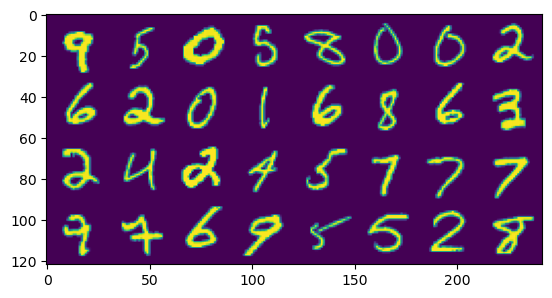

Epoch [45/50] Batch 0/1875                       Loss D: 0.6116, loss G: 1.0438


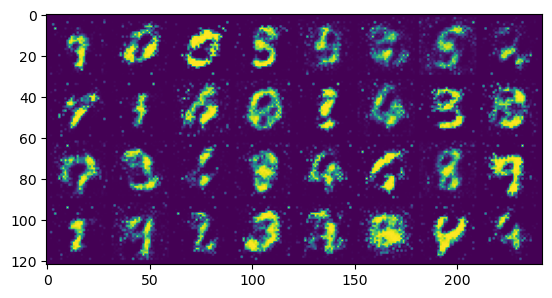

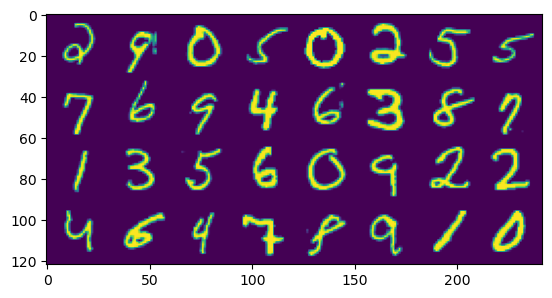

Epoch [46/50] Batch 0/1875                       Loss D: 0.7186, loss G: 1.0562


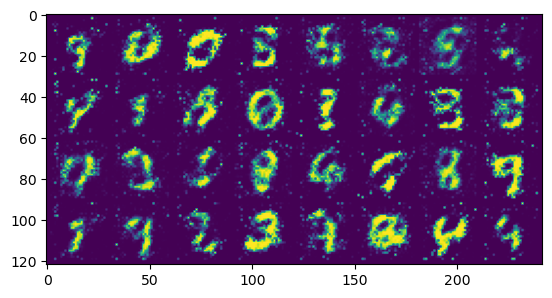

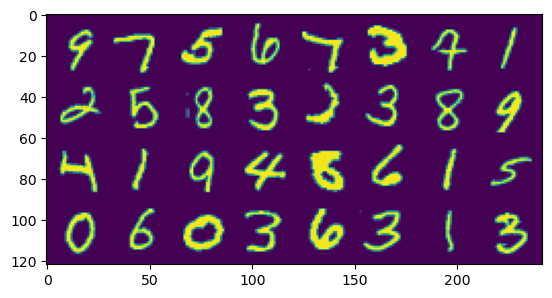

Epoch [47/50] Batch 0/1875                       Loss D: 0.6205, loss G: 0.9835


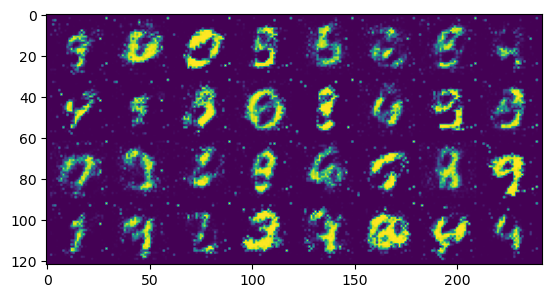

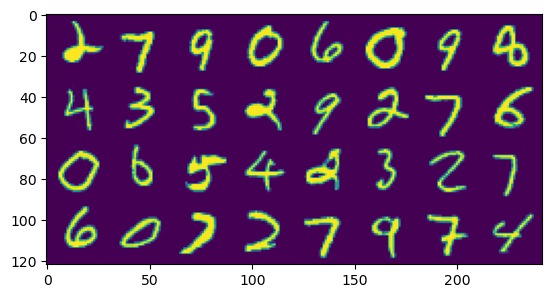

Epoch [48/50] Batch 0/1875                       Loss D: 0.5880, loss G: 1.2186


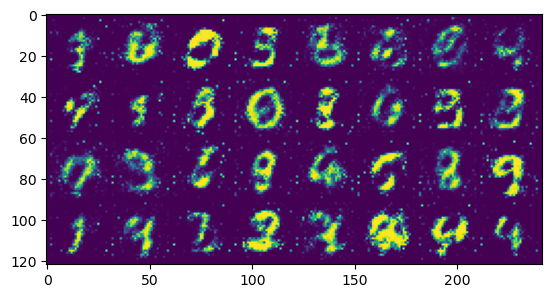

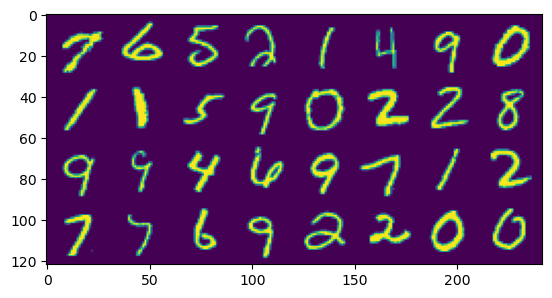

Epoch [49/50] Batch 0/1875                       Loss D: 0.7929, loss G: 0.6691


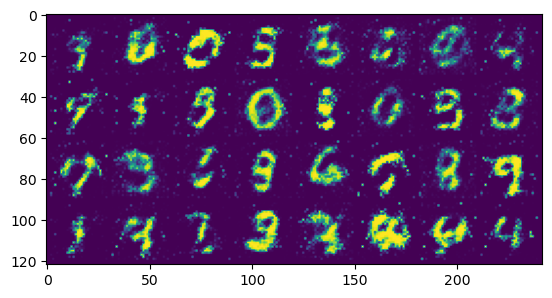

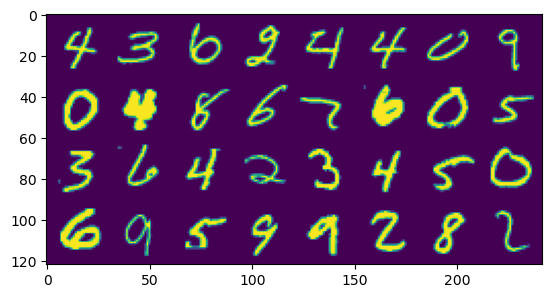

In [7]:
# training the GAN
for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(loader):
        real = real.view(-1, 784).to(device)
        batch_size = real.shape[0]

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        noise = torch.randn(batch_size, z_dim).to(device)
        fake = gen(noise)
        disc_real = disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake) / 2
        disc.zero_grad()
        lossD.backward(retain_graph=True)
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        # where the second option of maximizing doesn't suffer from
        # saturating gradients
        output = disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()

        if batch_idx == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(loader)} \
                      Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
            )

            # appending losses per epoch
            lossG_arr.append(lossG)
            lossD_arr.append(lossD)
            
            with torch.no_grad():
                fake = gen(fixed_noise).reshape(-1, 1, 28, 28)
                data = real.reshape(-1, 1, 28, 28)
                img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
                img_grid_real = torchvision.utils.make_grid(data, normalize=True)
                
                plt.imshow(img_grid_fake[0])
                plt.show()
                plt.imshow(img_grid_real[0])
                plt.show()

                writer_fake.add_image(
                    "Mnist Fake Images", img_grid_fake, global_step=step
                )
                writer_real.add_image(
                    "Mnist Real Images", img_grid_real, global_step=step
                )
                step += 1

In [19]:
for i in range(len(lossD_arr)):
    lossD_arr[i] = lossD_arr[i].item()
    lossG_arr[i] = lossG_arr[i].item()

Text(0, 0.5, 'LossG')

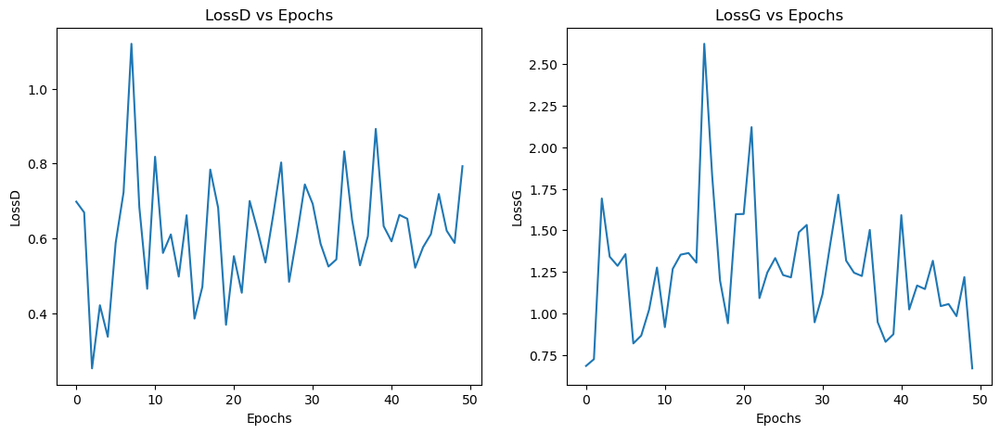

In [20]:
# next step is to plot the loss vs epochs
fig, axs = plt.subplots(1, 2, figsize=(13,5))

axs[0].plot(lossD_arr)
axs[0].set_title('LossD vs Epochs')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('LossD')

axs[1].plot(lossG_arr)
axs[1].set_title('LossG vs Epochs')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('LossG')

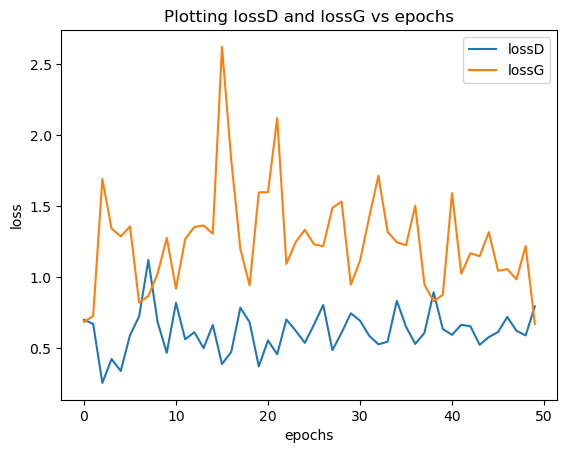

In [25]:
# Plotting lossD and lossG
plt.plot(lossD_arr)
plt.plot(lossG_arr)
plt.title('Plotting lossD and lossG vs epochs')
plt.legend(['lossD', 'lossG'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.show()

In [ ]:
for batch_idx, (real, _) in enumerate(loader):
    real = real.view(-1, 784).to(device)
    print(real.shape)

In [ ]:
28**2